In [1]:
%config InlineBackend.figure_format = 'retina'

In [2]:
# import packages
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import obspy

import rasterio
from pathlib import Path
import geopandas as gpd
from pyproj import Proj
from netCDF4 import Dataset

from obspy.clients.fdsn import Client
from obspy.geodetics import gps2dist_azimuth

from mpl_toolkits.basemap import Basemap
from matplotlib.colors import LogNorm

In [3]:
# values 
values = np.array([2.12, 2.14, 1.58, 1.80])
mean = np.mean(values)
variance = np.var(values, ddof = 1)
chi_square = np.sum((values - mean)**2 / variance)

chi_square

np.float64(2.9999999999999996)

In [4]:
# values 
values = np.array([10.29, 0.72, -20.67, 1.09])
mean = np.mean(values)
variance = np.var(values, ddof = 1)
chi_square = np.sum((values - mean)**2 / variance)



In [3]:
ap = Client('IRIS') # Iris client

In [6]:
import geopandas as gpd
from shapely.geometry import Point

# Define the coordinate systems
latlon_crs = "EPSG:4326"     # Geographic coordinates
polar_crs = "EPSG:3031"      # Antarctic Polar Stereographic

# Define the center coordinate (longitude, latitude)
lon, lat = -107.70, -75.72

# Step 1: Create GeoDataFrame with the point in lat/lon
gdf_latlon = gpd.GeoDataFrame(geometry=[Point(lon, lat)], crs=latlon_crs)

# Step 2: Reproject to EPSG:3031
gdf_polar = gdf_latlon.to_crs(polar_crs)

# Step 3: Create a 30 km buffer (30,000 meters)
circle = gdf_polar.geometry[0].buffer(30000)  # 30 km radius

# Step 4: Save to shapefile
circle_gdf = gpd.GeoDataFrame(geometry=[circle], crs=polar_crs)
circle_gdf.to_file("circle3_30km_epsg3031.shp")


# Loading the Datasets

In [4]:
# loading in Antarctic stations

inv_LH = ap.get_stations(network='*', station="*", level='response', channel='LHZ', starttime=obspy.UTCDateTime(2010,1,1,1),
                      endtime = obspy.UTCDateTime(2024,1,1,1), maxlatitude=-63)
print(inv_LH)

sta_lats = []
sta_lons = []
for i in range(len(inv_LH)):
    for j in range(len(inv_LH[i])):
        sta_lats.append(inv_LH[i][j].latitude)
        sta_lons.append(inv_LH[i][j].longitude)

print('Number of stations:', len(sta_lats))

Inventory created at 2025-10-19T07:58:53.637100Z
	Created by: IRIS WEB SERVICE: fdsnws-station | version: 1.1.52
		    http://service.iris.edu/fdsnws/station/1/query?starttime=2010-01-...
	Sending institution: IRIS-DMC (IRIS-DMC)
	Contains:
		Networks (22):
			1D, 1G, 1J, 2H, 7U, 8E, 9G, ER, G, GE, IM, IU, PS, XC, XD, XH, YD, 
			YE, YT, YW, ZJ, ZM
		Stations (238):
			1D.ATOL (Atoll, Alexander Island)
			1D.BREN (Brenneke Nunatak)
			1D.ELSW (Ellsworth Land)
			1D.FOSS (Fossil Bluff)
			1D.FOWL (Fowler Peninsula ZK15)
			1D.KEAL (Kealey Ice Rise)
			1D.KIBB (Mt McKibben)
			1D.PIG1 (PIG1)
			1D.PIG2 (PIG2)
			1D.PIG3 (PIG3)
			1D.PIG4 (PIG4)
			1D.PIGD (PIGD)
			1D.ROTH (Rothera)
			1D.WELC (Welch Mountains)
			1G.HOO (HOO) (2x)
			1J.TI1A (None)
			1J.TI3A (TI3A)
			1J.TI3B (None)
			1J.TI3C (TI3C)
			1J.TI4A (TI4A)
			1J.TI6A (TI6A)
			1J.TI6B (TI6B)
			1J.TI6C (TI6C)
			1J.TI7A (TI7A)
			1J.TI8A (TI8A)
			1J.TI8B (TI8B)
			1J.TI8C (TI8C)
			2H.CONZ (Mt Erebus site Truncated Cones) 

In [5]:
# cutting down to within about 1000 km

PIG_lat = -75
PIG_lon = -99.5

max_dist = 1000e3 # meters

sta_lats_cut = []
sta_lons_cut = []


for i in range(len(sta_lats)):
    dist, az, baz = gps2dist_azimuth(PIG_lat, PIG_lon, sta_lats[i], sta_lons[i])
    if dist < max_dist:
        sta_lats_cut.append(sta_lats[i])
        sta_lons_cut.append(sta_lons[i])

print('Number of stations within 1000 km:', len(sta_lats_cut))

Number of stations within 1000 km: 69


In [6]:
# importing son's events
events = pd.read_csv(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\Pham2025_submitted\TableS1.csv")
e_lats = events['relocated_latitude'].tolist()
e_lons = events['relocated_longitude'].tolist()
e_mags = events['Ms_BB'].tolist()
events

,evcode,relocated_latitude,relocated_longitude,relocated_time,max_cc,eff_nstations,Ms_BB,detected_time,detected_latitude,detected_longitude,quality_group,usgs_event,poli_event,csf_az,csf_amp
0,201004081006,-76.02,-106.56,2010-04-08T10:06:34.000000Z,0.78,1.61,2.37,2010-04-08T10:06:22.000000Z,-75.78,-104.93,B,False,False,NaN,NaN
1,201005081749,-74.98,-101.52,2010-05-08T17:49:08.000000Z,0.76,2.13,2.43,2010-05-08T17:49:12.000000Z,-75.10,-100.62,B,False,False,NaN,NaN
2,201006010156,-80.65,159.30,2010-06-01T01:56:43.000000Z,0.77,6.85,2.48,2010-06-01T01:56:46.000000Z,-80.70,159.78,B,True,False,NaN,NaN
3,201006171002,-75.21,-107.85,2010-06-17T10:02:05.000000Z,0.86,2.29,2.46,2010-06-17T10:02:06.000000Z,-75.09,-107.88,A,False,False,14.0,1.921205e+11
4,201012040308,NaN,NaN,2010-12-04T03:07:55.000000Z,0.76,2.01,2.13,2010-12-04T03:08:02.000000Z,-74.35,-105.26,B,False,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
363,202305270743,-75.34,-101.35,2023-05-27T07:43:18.000000Z,0.81,5.86,2.02,2023-05-27T07:43:24.000000Z,-75.54,-100.95,B,False,False,4.0,1.405849e+11
364,202306100843,-75.67,-108.93,2023-06-10T08:43:05.000000Z,0.85,5.28,2.36,2023-06-10T08:43:06.000000Z,-75.52,-108.43,B,False,False,NaN,NaN
365,202306221811,-75.38,-107.21,2023-06-22T18:11:05.000000Z,0.90,5.31,2.37,2023-06-22T18:11:12.000000Z,-75.52,-108.43,A,False,False,24.0,3.853117e+11
366,202307190438,-75.51,-106.52,2023-07-19T04:38:47.000000Z,0.91,6.15,2.56,2023-07-19T04:38:54.000000Z,-75.66,-106.70,B,False,False,-18.0,4.961041e+11


In [7]:
# importing lucas events
lucasdata = pd.read_csv(r"C:\Users\thele\Dropbox\PC\Desktop\Honours\python\catalogues\Lucas_events.csv")
l_lats = lucasdata['lat'].tolist()
l_lons = lucasdata['lon'].tolist()
l_mags = lucasdata['mag'].tolist()
lucasdata

,date,time,lat,lon,depth,mag,num_arrivals,loc_unc,dep_unc,type
0,2-Feb-16,09:39:05,-75.344,-99.574,0,1.8,4,1.6,2.2,Icequake
1,2-Feb-16,16:31:55,-75.413,-100.920,0,1.9,4,1.9,4.1,Icequake
2,2-Feb-16,17:01:35,-75.073,-99.286,0,1.6,4,1.6,16.0,Icequake
3,2-Feb-16,17:08:11,-75.337,-99.705,0,1.8,4,1.4,2.4,Icequake
4,3-Feb-16,01:20:26,-75.368,-99.015,0,1.9,5,0.9,2.1,Icequake
5,5-Feb-16,20:25:22,-75.337,-99.612,0,1.8,5,2.8,19.1,Icequake
6,5-Feb-16,20:50:15,-75.082,-99.248,0,1.6,5,2.8,17.3,Icequake
7,6-Feb-16,00:38:05,-75.341,-99.646,0,1.7,5,3.5,23.4,Icequake
8,6-Feb-16,00:41:54,-75.089,-99.260,0,1.5,4,3.0,16.2,Icequake
9,6-Feb-16,03:46:55,-75.351,-99.651,0,1.7,5,2.7,18.4,Icequake


In [8]:
# # Convert Antarctic coastlines to WGS84

# for fname in Path('Coastlines').glob('*.shp'):
#     data = gpd.read_file(fname)
#     data.to_crs(epsg=4326, inplace=True)
#     data.to_file(fname.with_name(fname.stem + '_wgs84.shp'))

In [9]:
# # Convert Antarctic grounding lines to WGS84

# for fname in Path('Groundinglines').glob('*.shp'):
#     data = gpd.read_file(fname)
#     data.to_crs(epsg=4326, inplace=True)
#     data.to_file(fname.with_name(fname.stem + '_wgs84.shp'))

In [10]:
# setting up a good stereographic projection reference
stere_proj = Proj('+proj=stere +lat_0=-90 +lat_ts=-71 +lon_0=0 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs')

In [11]:
# loading in background topography data
with rasterio.open('moa125_2014_hp1_v01.tif') as raster:
    img_x = np.linspace(raster.bounds.left, raster.bounds.right, raster.width)
    img_y = np.linspace(raster.bounds.top, raster.bounds.bottom, raster.height)
    img_data = raster.read(1)

In [12]:
# loading in ice speed data
with Dataset("Antarctica_ice_velocity_2019_2020_1km_v01.1.nc") as nc:
    speed_x = nc['x'][:]
    speed_y = nc['y'][:]
    speed_data = np.sqrt(nc['VX'][:]**2 + nc['VY'][:]**2)

# Plotting the Map

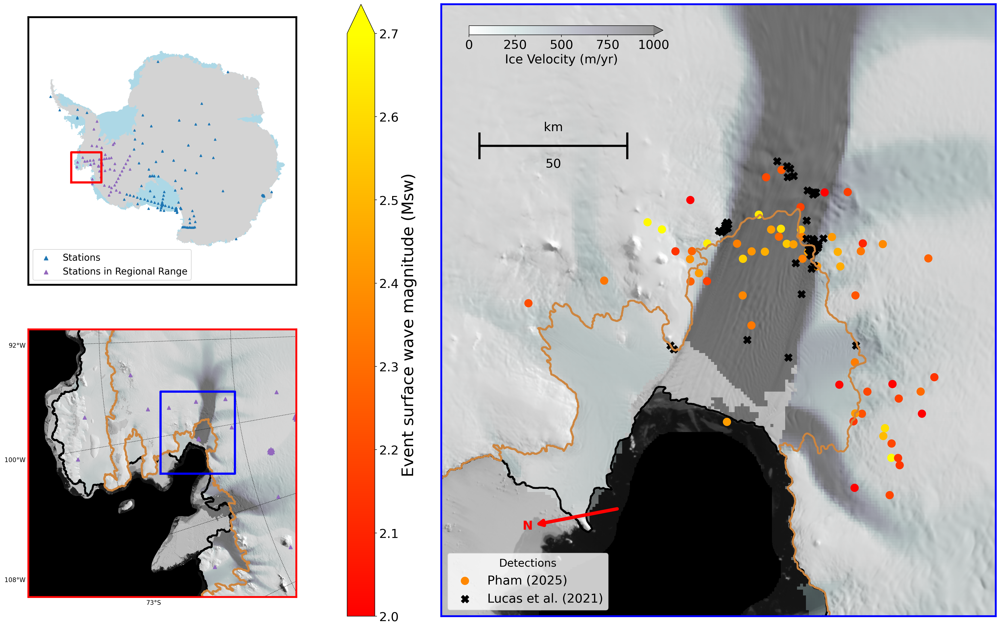

In [14]:
fig = plt.figure(figsize=(24, 14))

##################### plotting the map of full Antarctica
# setting up the axes
xa = fig.add_axes([0.05, 0.51, 0.25, 0.49], frameon=True)
for spine in xa.spines.values():
    spine.set_linewidth(3)
ma = Basemap(epsg='3031', width=6e6, height=6e6, ax=xa)
wa, ha = ma.xmax, ma.ymax
# coastlines
ma.readshapefile('Coastlines/moa2014_coastline_v01_wgs84', 'coastline', linewidth=.5, zorder=2, color='none')
for info, shape in zip(ma.coastline_info, ma.coastline): xa.fill(*zip(*shape), 'lightblue', zorder=1)
# grounding lines
ma.readshapefile('Groundinglines/moa2014_grounding_line_v01_wgs84', 'grounding', linewidth=.5, zorder=2, color='none')
for info, shape in zip(ma.grounding_info, ma.grounding): xa.fill(*zip(*shape), 'lightgray', zorder=1)
# stations
stations = ma.scatter(sta_lons, sta_lats, s=10, marker='^', latlon=True, label='Stations')
stations_range = ma.scatter(sta_lons_cut, sta_lats_cut, s=10, marker="^", latlon=True, c='tab:purple', label='Stations in Regional Range')
ma.ax.legend(fontsize='15', loc='lower left', markerscale=2)

##################### plotting zoomed in "Doomsday" map
# setting up the axes
xb = fig.add_axes([0.05, 0.01, 0.25, 0.49])
for spine in xb.spines.values():
    spine.set_edgecolor('r')
    spine.set_linewidth(3)
# setting up the map boundaries
urcrnrlonb, urcrnrlatb = -91.2445915, -77.5031021 # upper right corner
llcrnrlonb, llcrnrlatb = -109.0747014, -70.3435574 # lower left corner
mb = Basemap(epsg='3031', ax=xb, llcrnrlon=llcrnrlonb, llcrnrlat=llcrnrlatb, urcrnrlon=urcrnrlonb, urcrnrlat=urcrnrlatb)
wb, hb = mb.xmax, mb.ymax
mb.drawparallels(np.arange(-88,-70,3), labels=[0,0,0,1], latmax=89, dashes=(3, 2), linewidth=.5)
mb.drawmeridians(np.arange(-180,180,8), labels=[1,0,0,0], latmax=89, dashes=(3, 2), linewidth=.5)
# coastlines and grounding lines
mb.readshapefile('Coastlines/moa2014_coastline_v01_wgs84', 'coastline', linewidth=3, zorder=2, color='k')
mb.readshapefile('Groundinglines/moa2014_grounding_line_v01_wgs84', 'grounding', linewidth=3, zorder=2, color='peru')
xminb, yminb = stere_proj(mb.llcrnrlon, mb.llcrnrlat)
xmaxb, ymaxb = stere_proj(mb.urcrnrlon, mb.urcrnrlat)
# background topographic image
tmp = img_data[np.logical_and(yminb<=img_y, img_y<=ymaxb)][:, np.logical_and(xminb<=img_x, img_x<=xmaxb)]
mb.imshow(tmp, cmap='gray', origin='upper', vmax=2.2e4)
# ice velocity data
tmp = speed_data[np.logical_and(yminb<=speed_y, speed_y<=ymaxb)][:, np.logical_and(xminb<=speed_x, speed_x<=xmaxb)]
mappable = mb.imshow(tmp, cmap='bone_r', origin='upper', alpha=.4, vmin=0, vmax=1e3)

stations = mb.scatter(sta_lons, sta_lats, s=30, marker='^', latlon=True, label='Stations')
stations_range = mb.scatter(sta_lons_cut, sta_lats_cut, s=30, marker='^', c='tab:purple', latlon=True)

# plotting the box of the zoomed in map on the original map
halfer = 3000000
llxb, llyb =  (halfer-2037687.969924)/wa, (halfer-704605.263157)/ha
urxb, uryb =  (halfer-1362687.969924)/wa, (halfer-29605.263157)/ha
bound = dict(ll=(llxb*wa, llyb*ha), ur=(urxb*wa, uryb*ha))
box_x = [bound['ll'][0], bound['ll'][0], bound['ur'][0], bound['ur'][0], bound['ll'][0]]
box_y = [bound['ll'][1], bound['ur'][1], bound['ur'][1], bound['ll'][1], bound['ll'][1]]
ma.plot(box_x, box_y, 'r-', lw=3.5)


##################### plotting the PIG map
# setting up the axes
xc = fig.add_axes([0.30, 0.01, 0.70, 0.98])
for spine in xc.spines.values():
    spine.set_edgecolor('blue')
    spine.set_linewidth(3)
# setting up the map boundaries    
urcrnrlonc, urcrnrlatc = -97, -76 # upper right corner
llcrnrlonc, llcrnrlatc = -103, -74 # lower left corner
mc = Basemap(epsg='3031', ax=xc, llcrnrlon=llcrnrlonc, llcrnrlat=llcrnrlatc, urcrnrlon=urcrnrlonc, urcrnrlat=urcrnrlatc)
# coastlines and grounding lines
mc.readshapefile('Coastlines/moa2014_coastline_v01_wgs84', 'coastline', linewidth=3, zorder=2, color='k')
mc.readshapefile('Groundinglines/moa2014_grounding_line_v01_wgs84', 'grounding', linewidth=3, zorder=2, color='peru')
xminc, yminc = stere_proj(mc.llcrnrlon, mc.llcrnrlat)
xmaxc, ymaxc = stere_proj(mc.urcrnrlon, mc.urcrnrlat)
# background topographic image
tmp = img_data[np.logical_and(yminc<=img_y, img_y<=ymaxc)][:, np.logical_and(xminc<=img_x, img_x<=xmaxc)]
mc.imshow(tmp, cmap='gray', origin='upper', vmax=2.2e4)
# ice velocity data
tmp_c = speed_data[np.logical_and(yminc<=speed_y, speed_y<=ymaxc)][:, np.logical_and(xminc<=speed_x, speed_x<=xmaxc)]
mappable_c = mc.imshow(tmp_c, cmap='bone_r', origin='upper', alpha=.4, vmin=0, vmax=1e3)
# plotting Son's seismic data
son = mc.scatter(e_lons, e_lats, c=e_mags, s=150, cmap='autumn', vmin=2.0, vmax=2.7, latlon=True, label = 'Pham (2025)')
cbar2 = mc.colorbar(mappable=son, location='left', pad='12%', extend='max')
cbar2.ax.tick_params(labelsize=20)
cbar2.set_label('Event surface wave magnitude (Msw)', fontsize='26')
# plotting Lucas 2021 seismic data
lucas = mc.scatter(l_lons, l_lats, c='k', marker='X', s=150, latlon=True, label='Lucas et al. (2021)')

# stations = mc.scatter(sta_lons, sta_lats, s=150, marker='^', latlon=True, label='Stations')


# adding a legend
mc.ax.legend(fontsize='20', loc='lower left', title='Detections', title_fontsize='xx-large')

# Ice velocity colourbar
cax = mc.ax.inset_axes([0.05, 0.95, 0.35, 0.015])
cbar = fig.colorbar(mappable_c, cax=cax, orientation='horizontal', label='Ice Velocity (m/yr)', extend='max')
cbar.ax.xaxis.label.set_fontsize(20)
cbar.ax.tick_params(labelsize=20)

# scale bar
mc.drawmapscale(*(-98, -74.6), *(-98, -74.6), length=50, units='km', fontsize=20, zorder=3, linewidth=3.5)

mc.ax.annotate('N', xy=mc(-102.25, -74.6), xytext=mc(-102.25, -74.3), fontsize=20, fontweight='bold', color='r',
              arrowprops=dict(arrowstyle='<|-', linewidth=5.5, color='r'))

# plotting the box of the PIG map on the zoomed in map
llxc, llyc = (-1704532.2681062596+2037687.969924)/wb, (-393522.2814528456+704605.263157)/hb
urxc, uryc = (-1517049.2043177367+2037687.969924)/wb, (-186270.22042025393+704605.263157)/hb
bound2 = dict(ll=(llxc*wb, llyc*hb), ur=(urxc*wb, uryc*hb))
box_xx = [bound2['ll'][0], bound2['ll'][0], bound2['ur'][0], bound2['ur'][0], bound2['ll'][0]]
box_yy = [bound2['ll'][1], bound2['ur'][1], bound2['ur'][1], bound2['ll'][1], bound2['ll'][1]]
mb.plot(box_xx, box_yy, c='blue', ls='-', lw=3.5)

plt.show()
fig.savefig('EventsMapSeptember22025.png')

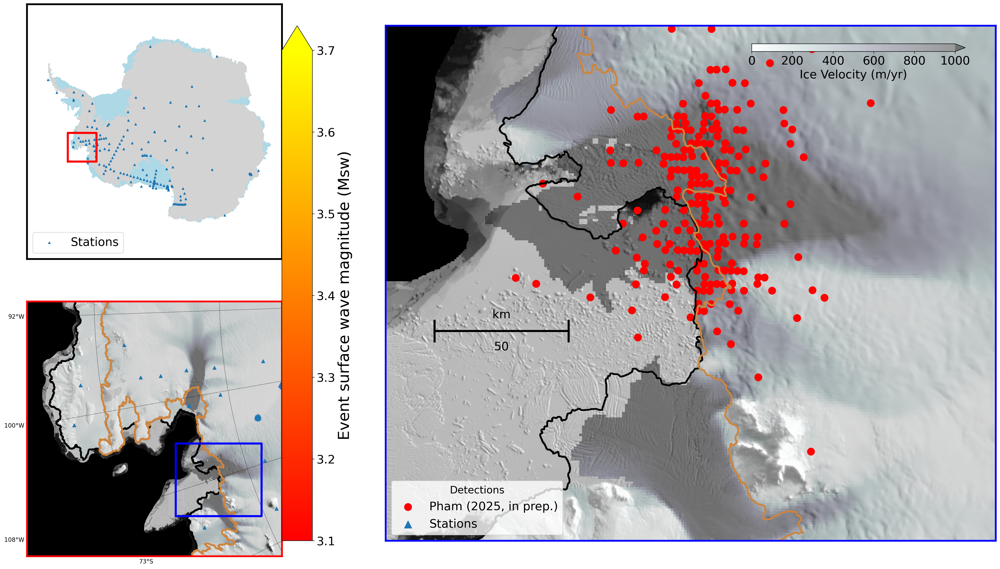

In [16]:
fig = plt.figure(figsize=(24, 14))

##################### plotting the map of full Antarctica
# setting up the axes
xa = fig.add_axes([0.05, 0.51, 0.25, 0.49], frameon=True)
for spine in xa.spines.values():
    spine.set_linewidth(3)
ma = Basemap(epsg='3031', width=6e6, height=6e6, ax=xa)
wa, ha = ma.xmax, ma.ymax
# coastlines
ma.readshapefile('Coastlines/moa2014_coastline_v01_wgs84', 'coastline', linewidth=.5, zorder=2, color='none')
for info, shape in zip(ma.coastline_info, ma.coastline): xa.fill(*zip(*shape), 'lightblue', zorder=1)
# grounding lines
ma.readshapefile('Groundinglines/moa2014_grounding_line_v01_wgs84', 'grounding', linewidth=.5, zorder=2, color='none')
for info, shape in zip(ma.grounding_info, ma.grounding): xa.fill(*zip(*shape), 'lightgray', zorder=1)
# stations
stations = ma.scatter(sta_lons, sta_lats, s=10, marker='^', latlon=True, label='Stations')
ma.ax.legend(fontsize='20', loc='lower left')

##################### plotting zoomed in "Doomsday" map
# setting up the axes
xb = fig.add_axes([0.05, 0.01, 0.25, 0.49])
for spine in xb.spines.values():
    spine.set_edgecolor('r')
    spine.set_linewidth(3)
# setting up the map boundaries
urcrnrlonb, urcrnrlatb = -91.2445915, -77.5031021 # upper right corner
llcrnrlonb, llcrnrlatb = -109.0747014, -70.3435574 # lower left corner
mb = Basemap(epsg='3031', ax=xb, llcrnrlon=llcrnrlonb, llcrnrlat=llcrnrlatb, urcrnrlon=urcrnrlonb, urcrnrlat=urcrnrlatb)
wb, hb = mb.xmax, mb.ymax
mb.drawparallels(np.arange(-88,-70,3), labels=[0,0,0,1], latmax=89, dashes=(3, 2), linewidth=.5)
mb.drawmeridians(np.arange(-180,180,8), labels=[1,0,0,0], latmax=89, dashes=(3, 2), linewidth=.5)
# coastlines and grounding lines
mb.readshapefile('Coastlines/moa2014_coastline_v01_wgs84', 'coastline', linewidth=3, zorder=2, color='k')
mb.readshapefile('Groundinglines/moa2014_grounding_line_v01_wgs84', 'grounding', linewidth=3, zorder=2, color='peru')
xminb, yminb = stere_proj(mb.llcrnrlon, mb.llcrnrlat)
xmaxb, ymaxb = stere_proj(mb.urcrnrlon, mb.urcrnrlat)
# background topographic image
tmp = img_data[np.logical_and(yminb<=img_y, img_y<=ymaxb)][:, np.logical_and(xminb<=img_x, img_x<=xmaxb)]
mb.imshow(tmp, cmap='gray', origin='upper', vmax=2.2e4)
# ice velocity data
tmp = speed_data[np.logical_and(yminb<=speed_y, speed_y<=ymaxb)][:, np.logical_and(xminb<=speed_x, speed_x<=xmaxb)]
mappable = mb.imshow(tmp, cmap='bone_r', origin='upper', alpha=.4, vmin=0, vmax=1e3)

stations = mb.scatter(sta_lons, sta_lats, s=30, marker='^', latlon=True, label='Stations')


# plotting the box of the zoomed in map on the original map
halfer = 3000000
llxb, llyb =  (halfer-2037687.969924)/wa, (halfer-704605.263157)/ha
urxb, uryb =  (halfer-1362687.969924)/wa, (halfer-29605.263157)/ha
bound = dict(ll=(llxb*wa, llyb*ha), ur=(urxb*wa, uryb*ha))
box_x = [bound['ll'][0], bound['ll'][0], bound['ur'][0], bound['ur'][0], bound['ll'][0]]
box_y = [bound['ll'][1], bound['ur'][1], bound['ur'][1], bound['ll'][1], bound['ll'][1]]
ma.plot(box_x, box_y, 'r-', lw=3.5)


##################### plotting the PIG map
# setting up the axes
xc = fig.add_axes([0.30, 0.01, 0.70, 0.98])
for spine in xc.spines.values():
    spine.set_edgecolor('blue')
    spine.set_linewidth(3)
# setting up the map boundaries    
urcrnrlonc, urcrnrlatc = -106, -76.5 # upper right corner
llcrnrlonc, llcrnrlatc = -110, -74 # lower left corner
mc = Basemap(epsg='3031', ax=xc, llcrnrlon=llcrnrlonc, llcrnrlat=llcrnrlatc, urcrnrlon=urcrnrlonc, urcrnrlat=urcrnrlatc)
# coastlines and grounding lines
mc.readshapefile('Coastlines/moa2014_coastline_v01_wgs84', 'coastline', linewidth=3, zorder=2, color='k')
mc.readshapefile('Groundinglines/moa2014_grounding_line_v01_wgs84', 'grounding', linewidth=3, zorder=2, color='peru')
xminc, yminc = stere_proj(mc.llcrnrlon, mc.llcrnrlat)
xmaxc, ymaxc = stere_proj(mc.urcrnrlon, mc.urcrnrlat)
# background topographic image
tmp = img_data[np.logical_and(yminc<=img_y, img_y<=ymaxc)][:, np.logical_and(xminc<=img_x, img_x<=xmaxc)]
mc.imshow(tmp, cmap='gray', origin='upper', vmax=2.2e4)
# ice velocity data
tmp_c = speed_data[np.logical_and(yminc<=speed_y, speed_y<=ymaxc)][:, np.logical_and(xminc<=speed_x, speed_x<=xmaxc)]
mappable_c = mc.imshow(tmp_c, cmap='bone_r', origin='upper', alpha=.4, vmin=0, vmax=1e3)
# plotting Son's seismic data
son = mc.scatter(e_lons, e_lats, c=e_mags, s=150, cmap='autumn', vmin=3.1, vmax=3.7, latlon=True, label = 'Pham (2025, in prep.)')
cbar2 = mc.colorbar(mappable=son, location='left', pad='12%', extend='max')
cbar2.ax.tick_params(labelsize=20)
cbar2.set_label('Event surface wave magnitude (Msw)', fontsize='26')
# plotting Lucas 2021 seismic data
#lucas = mc.scatter(l_lons, l_lats, c='k', marker='X', s=150, latlon=True, label='Lucas et al. (2021)')

stations = mc.scatter(sta_lons, sta_lats, s=150, marker='^', latlon=True, label='Stations')


# adding a legend
mc.ax.legend(fontsize='20', loc='lower left', title='Detections', title_fontsize='xx-large')

# Ice velocity colourbar
cax = mc.ax.inset_axes([0.6, 0.95, 0.35, 0.015])
cbar = fig.colorbar(mappable_c, cax=cax, orientation='horizontal', label='Ice Velocity (m/yr)', extend='max')
cbar.ax.xaxis.label.set_fontsize(20)
cbar.ax.tick_params(labelsize=20)

# scale bar
mc.drawmapscale(*(-108, -74.6), *(-108, -74.6), length=50, units='km', fontsize=20, zorder=3, linewidth=3.5)

# plotting the box of the PIG map on the zoomed in map
llxc, llyc = (-1643868.6410013682+2037687.969924)/wb, (-598319.2543681316+704605.263157)/hb
urxc, uryc = (-1416282.1583887967+2037687.969924)/wb, (-406112.37385051243+704605.263157)/hb
bound2 = dict(ll=(llxc*wb, llyc*hb), ur=(urxc*wb, uryc*hb))
box_xx = [bound2['ll'][0], bound2['ll'][0], bound2['ur'][0], bound2['ur'][0], bound2['ll'][0]]
box_yy = [bound2['ll'][1], bound2['ur'][1], bound2['ur'][1], bound2['ll'][1], bound2['ll'][1]]
mb.plot(box_xx, box_yy, c='blue', ls='-', lw=3.5)

plt.show()
#fig.savefig('EventsMap.png')

In [17]:
# watermarking 
watermark_list = ["numpy", "matplotlib", "pandas", "obspy", "rasterio", "geopandas", "pyproj", "netCDF4"]
for pkg in watermark_list:
    pkg_var = __import__(pkg)
    print(pkg, getattr(pkg_var, "__version__"))

!python --version

numpy 2.3.2
matplotlib 3.10.3
pandas 2.3.1
obspy 1.4.2
rasterio 1.4.3
geopandas 1.1.1
pyproj 3.7.1
netCDF4 1.7.2
Python 3.11.13
